# Segregate Train and test data from face_images

In [14]:
import cv2
import os
import glob
from random import shuffle
import shutil
import math
test_dir = "blue_cis6930/nghosh/Test"
train_dir = "blue_cis6930/nghosh/Train"
input_dir = "face_images"
if not os.path.isdir("blue_cis6930"):
    os.mkdir("blue_cis6930")
    os.mkdir("blue_cis6930/nghosh")

if not os.path.isdir(test_dir) and not os.path.isdir(train_dir):
    os.mkdir(train_dir)
    os.mkdir(test_dir)
inside_test = os.listdir(test_dir)
inside_train = os.listdir(train_dir)
if len(inside_test) == 0 or len(inside_train) == 0:
    files = [os.path.join(input_dir,fle) for fle in os.listdir(input_dir)]
    dst_dir = train_dir
    file_count = sum([len(files) for r, d, files in os.walk(input_dir)])
    train_num = math.ceil(0.9*float(file_count))
    test_num = file_count - train_num
    num_copied = 0
    print(train_num)
    shuffle(files)
    for fle in files:
      if os.path.isfile(fle):
          with open(fle) as f:
            if num_copied == train_num:
              dst_dir = test_dir
            shutil.copy(fle, dst_dir)
            num_copied += 1

In [15]:
## Imports

import torch
import torchvision
from PIL import Image, ImageMath
import glob
import cv2
from torch.utils.data.dataset import Dataset
import random
import numpy as np
import matplotlib.pyplot as plt


In [16]:
# Define device for Cuda
# useTanh - Flag to train & test model for optional credit 1(use tanh in output layer)
# By default, usetanh= False, meaning running this program trains and test the colorization(without Tanh)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
useTanh = False

# Data Loading & Augmentation

In [17]:
# Custom class RandomScale to randomly scale the values of RGB image between 0.6, 1
# Used for data augmentation

class RandomScale(object):

    def __call__(self, img):
        rand = torch.tensor(random.uniform(0.6,1.0), dtype=torch.float32)
        img = (torchvision.transforms.ToTensor()(img)).float()
        img = img*rand
        return img


    def __repr__(self):
        return self.__class__.__name__ + '()'

In [18]:
# Utility function to convert RGB to lab image
# Post conversion, returns normalised L, a & b channels

def convertRGBToLAB(img):
  lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB).astype("float32")
  l,a,b = cv2.split(lab)
  l = l/100
  # Optional credit(OC)
  if useTanh == True:
    a = a/128
    b = b/128
  return (l, a, b)

In [19]:
# Custom Dataset that applies random scale, random horizontal flip and
# random crop to each train image 10 times. This custom class is reused for test loader too.
# Resize each augmented/ test image to 128x128

class ColorDataset(Dataset):
  def __init__(self, folder_path, transform=None, ran=None):
    self.image_list = glob.glob(folder_path)
    self.transform = transform
    self.T = []
    for img in self.image_list:
      single_img = Image.open(img)
      #single_img = (torchvision.transforms.ToTensor()(single_img)).float()
      if self.transform !=None:
        if ran != None: 
          for i in range(10):
            tran = self.transform(single_img)
            l,a,b = convertRGBToLAB(np.asarray(tran.permute(1,2,0)))
            self.T.append((l,a,b))
        else:
          #single_img = (torchvision.transforms.ToTensor()(single_img)).float()
          tran = self.transform(single_img)
          l,a,b = convertRGBToLAB(np.asarray(tran.permute(1,2,0)))
          self.T.append((l,a,b))

    self.data_len = len(self.T)
       
  def __getitem__(self, index):
    return self.T[index]

  def __len__(self):
    return self.data_len

In [20]:
# Load the train dataset after creating 10 augmented & resized image per input train image

transforms = torchvision.transforms.Compose([
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomResizedCrop(128),
    RandomScale(),
    torchvision.transforms.ToPILImage(),
    
    torchvision.transforms.ToTensor()
])
train_dir = "blue_cis6930/nghosh/Train/*"
dataset = ColorDataset(train_dir, transforms, 10)
train_loader = torch.utils.data.DataLoader(dataset=dataset, shuffle=True, batch_size=100)

# Network definition & Training

In [21]:
# defining a network 
import torch.nn as nn
import torch.nn.functional as F

In [22]:
# Network for main assignment
class ColorNetwork(nn.Module):
  def __init__(self):
    super(ColorNetwork, self).__init__()
    
    self.layers = nn.Sequential(
        nn.Conv2d(1,16,kernel_size=3,stride=2),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(),
        nn.Conv2d(16,32,kernel_size=3,stride=2),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(),
        nn.Conv2d(32,64,kernel_size=3,stride=2),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(),
        nn.Conv2d(64,128,kernel_size=3,stride=2),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(),
        nn.Conv2d(128,256,kernel_size=3,stride=2),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(),
        # Deconvolution

        nn.ConvTranspose2d(256, 128, kernel_size=3,stride=2),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(128, 64, kernel_size=3,stride=2),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(64, 32, kernel_size=3,stride=2),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(32, 16, kernel_size=3,stride=2),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(16, 2, kernel_size=3,stride=2, output_padding=1),
    )

  def forward(self, inputVal):
      inputVal = self.layers(inputVal)       
      return inputVal

In [23]:
# Network for Optional Credit part 1(Use Tanh)
class ColorNetwork_OC1(nn.Module):
  def __init__(self):
    super(ColorNetwork_OC1, self).__init__()
    
    self.layers = nn.Sequential(
        nn.Conv2d(1,16,kernel_size=3,stride=2),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(),
        nn.Conv2d(16,32,kernel_size=3,stride=2),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(),
        nn.Conv2d(32,64,kernel_size=3,stride=2),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(),
        nn.Conv2d(64,128,kernel_size=3,stride=2),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(),
        nn.Conv2d(128,256,kernel_size=3,stride=2),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(),
        # Deconvolution

        nn.ConvTranspose2d(256, 128, kernel_size=3,stride=2),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(128, 64, kernel_size=3,stride=2),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(64, 32, kernel_size=3,stride=2),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(32, 16, kernel_size=3,stride=2),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(),
        nn.ConvTranspose2d(16, 2, kernel_size=3,stride=2, output_padding=1),
        nn.Tanh()
    )

  def forward(self, inputVal):
      inputVal = self.layers(inputVal)       
      return inputVal

In [24]:
# Initialize the model as main network or optional credit network based on the flag useTanh

if useTanh == True:
  model = ColorNetwork_OC1().to(device)
else:
  model = ColorNetwork().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [25]:
# Function to train the network

def train(grayImage, targetValues, criterion, optimizer, model):
  
  predValues = model(grayImage)
  loss_train = criterion(predValues, targetValues)
  
  optimizer.zero_grad()
  loss_train.backward()
  optimizer.step()
  return (predValues, loss_train.item())


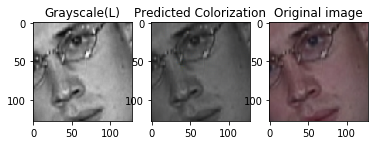

Loss in epoch  0  is  161.4515370761647


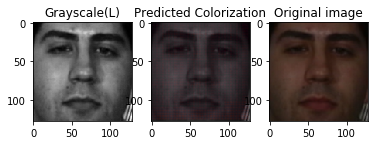

Loss in epoch  1  is  55.169149595148426


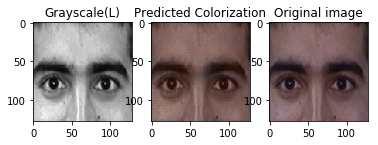

Loss in epoch  2  is  26.369168225456686


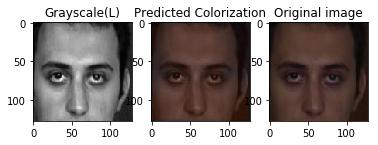

Loss in epoch  3  is  22.05012363546035


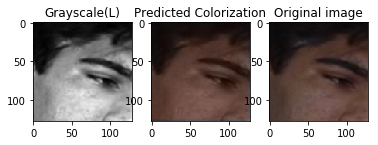

Loss in epoch  4  is  21.074225257424747


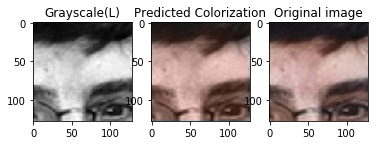

Loss in epoch  5  is  20.712652655208814


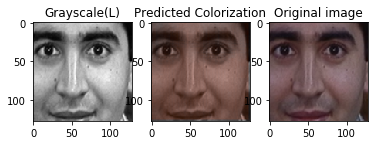

Loss in epoch  6  is  20.482092632966882


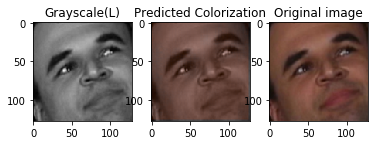

Loss in epoch  7  is  20.169570810654584


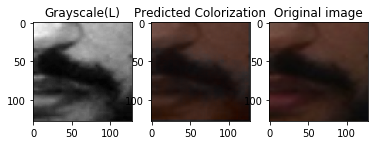

Loss in epoch  8  is  20.055027765386246


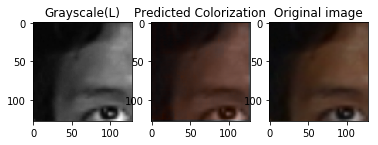

Loss in epoch  9  is  19.893227661357205


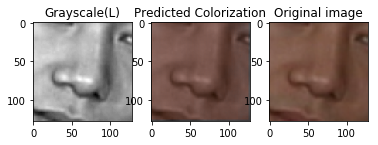

Loss in epoch  10  is  19.80046003005084


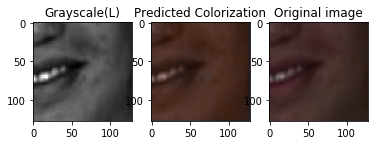

Loss in epoch  11  is  19.76334877575145


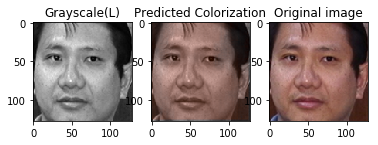

Loss in epoch  12  is  19.683627128601074


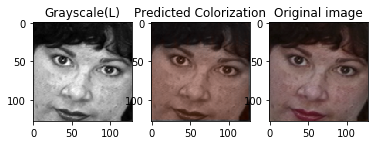

Loss in epoch  13  is  19.65288465163287


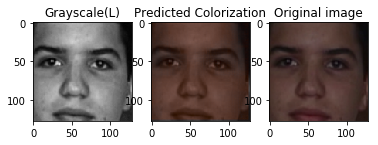

Loss in epoch  14  is  19.573816860423367


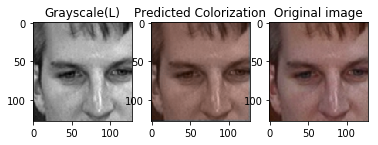

Loss in epoch  15  is  19.558019189273608


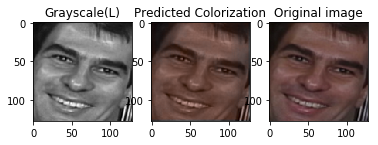

Loss in epoch  16  is  19.46505375469432


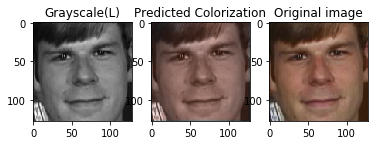

Loss in epoch  17  is  19.37891631967881


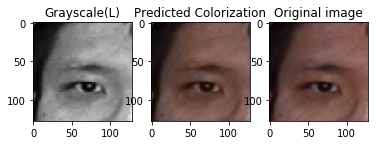

Loss in epoch  18  is  19.29215649997487


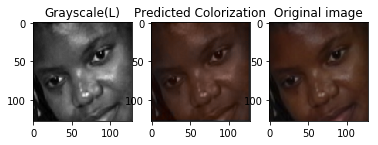

Loss in epoch  19  is  19.291451201719397


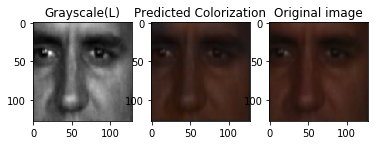

Loss in epoch  20  is  19.214783247779398


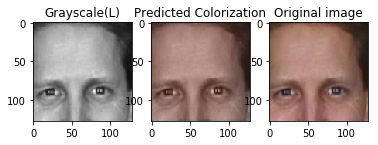

Loss in epoch  21  is  19.16044484867769


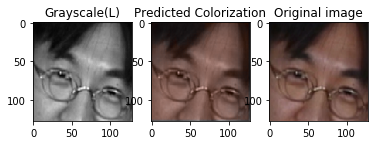

Loss in epoch  22  is  19.08970776726218


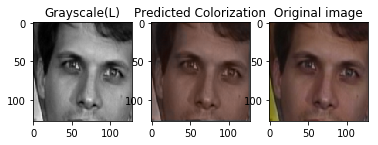

Loss in epoch  23  is  18.98098600611967


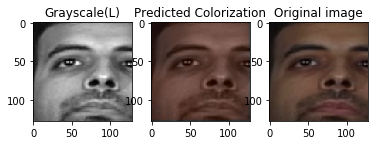

Loss in epoch  24  is  18.950311211978686


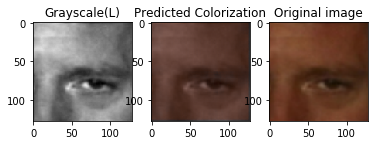

Loss in epoch  25  is  18.926024156458237


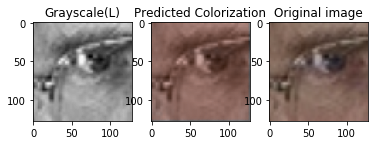

Loss in epoch  26  is  18.864313462201288


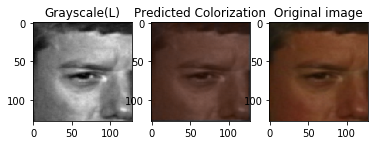

Loss in epoch  27  is  18.858959899229163


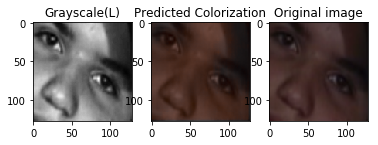

Loss in epoch  28  is  18.76358102349674


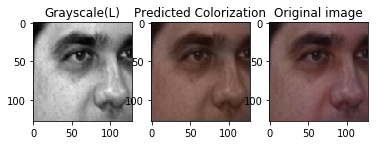

Loss in epoch  29  is  18.769388311049518


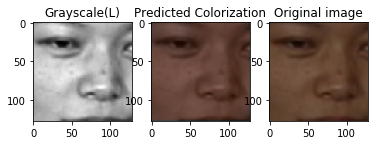

Loss in epoch  30  is  18.684436741997214


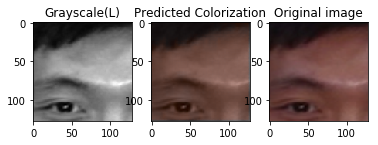

Loss in epoch  31  is  18.73476889554192


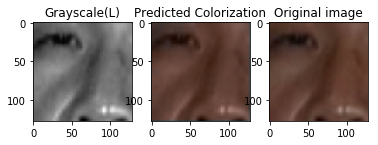

Loss in epoch  32  is  18.679193931467392


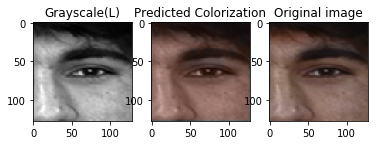

Loss in epoch  33  is  18.611610328449924


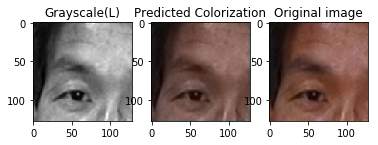

Loss in epoch  34  is  18.554025004891788


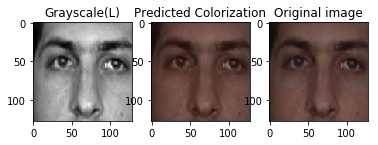

Loss in epoch  35  is  18.547244548797607


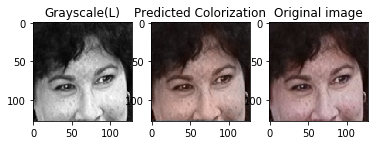

Loss in epoch  36  is  18.50495097216438


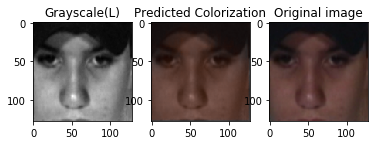

Loss in epoch  37  is  18.48483713935403


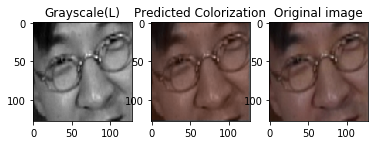

Loss in epoch  38  is  18.48101770176607


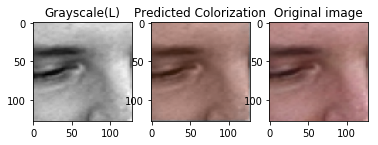

Loss in epoch  39  is  18.445845996632297


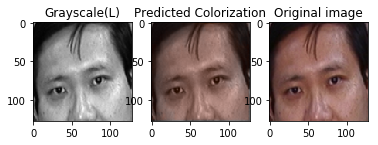

Loss in epoch  40  is  18.335314329932718


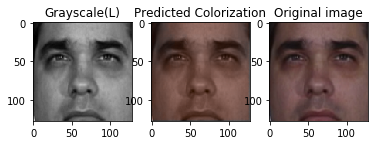

Loss in epoch  41  is  18.31075118569767


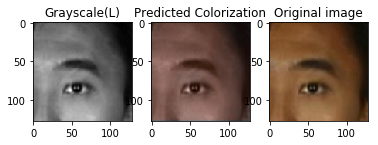

Loss in epoch  42  is  18.32497952966129


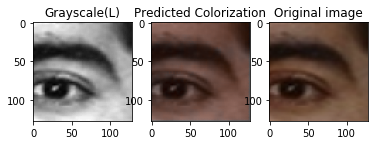

Loss in epoch  43  is  18.29619250578039


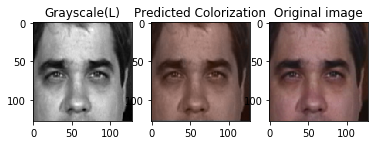

Loss in epoch  44  is  18.238144958720486


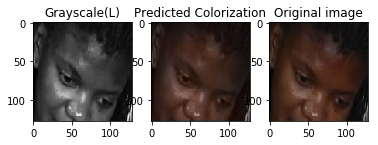

Loss in epoch  45  is  18.2300647427054


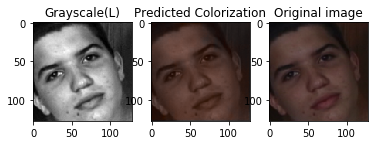

Loss in epoch  46  is  18.226432099061853


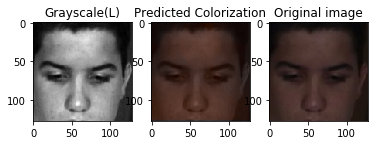

Loss in epoch  47  is  18.16973523532643


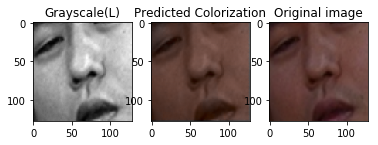

Loss in epoch  48  is  18.19080711813534


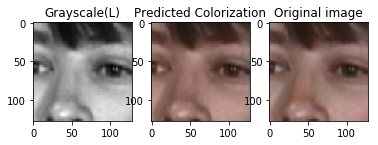

Loss in epoch  49  is  18.148622148177203


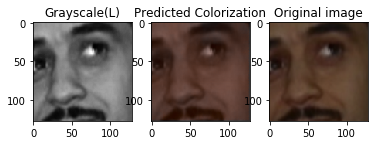

Loss in epoch  50  is  18.12449825511259


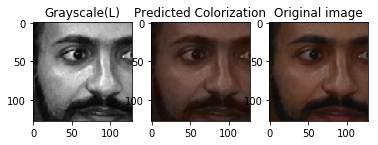

Loss in epoch  51  is  18.095015357522403


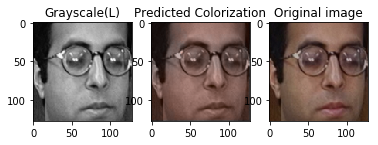

Loss in epoch  52  is  18.049983543508194


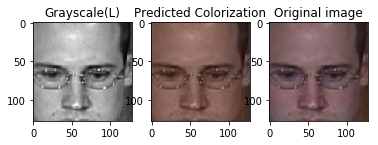

Loss in epoch  53  is  18.063655432532816


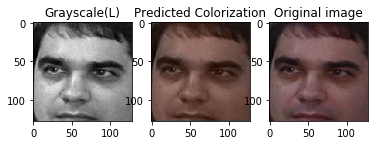

Loss in epoch  54  is  18.031304724076215


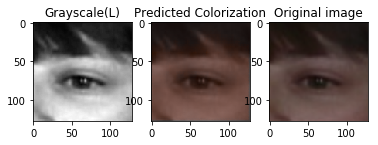

Loss in epoch  55  is  18.00923893030952


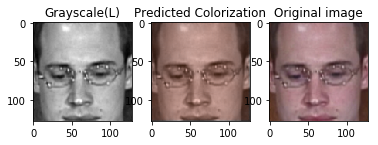

Loss in epoch  56  is  17.990829565945795


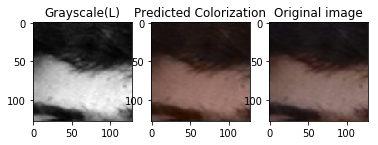

Loss in epoch  57  is  17.999982707640704


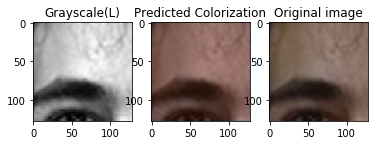

Loss in epoch  58  is  17.939139871036303


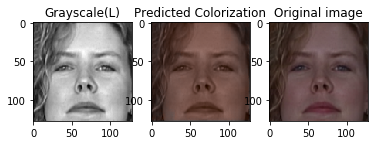

Loss in epoch  59  is  17.947800678365372


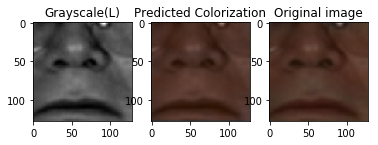

Loss in epoch  60  is  17.937618802575503


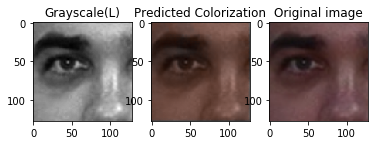

Loss in epoch  61  is  17.911466065575095


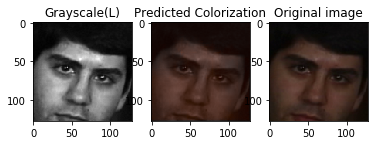

Loss in epoch  62  is  17.987048583872177


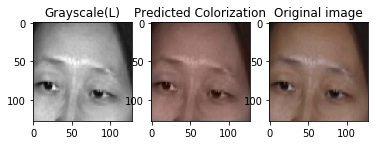

Loss in epoch  63  is  17.86812137154972


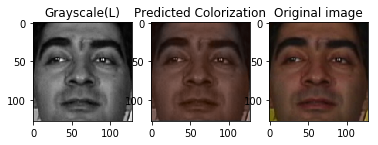

Loss in epoch  64  is  17.87021566839779


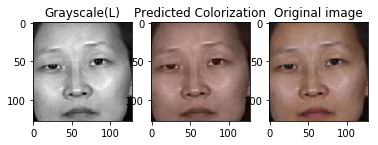

Loss in epoch  65  is  17.822749754961798


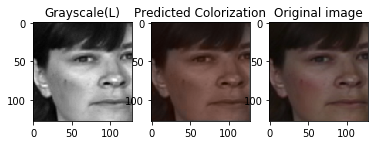

Loss in epoch  66  is  17.85458467988407


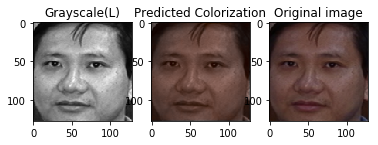

Loss in epoch  67  is  17.86854879996356


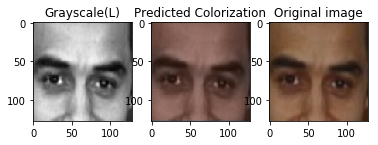

Loss in epoch  68  is  17.85564997616936


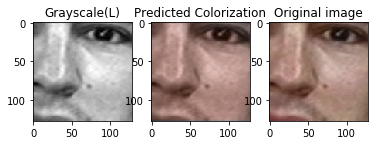

Loss in epoch  69  is  17.847630879458258


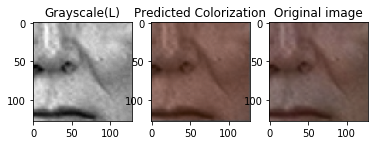

Loss in epoch  70  is  17.82752812609953


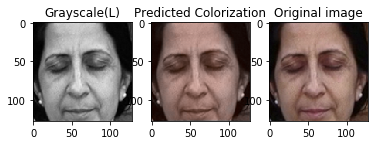

Loss in epoch  71  is  17.803114456288956


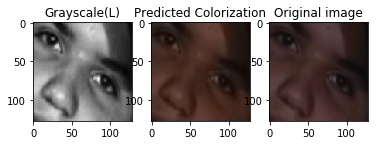

Loss in epoch  72  is  17.847614568822525


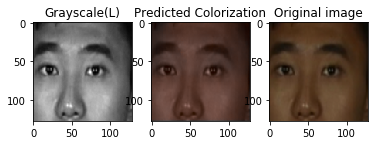

Loss in epoch  73  is  17.82633449049557


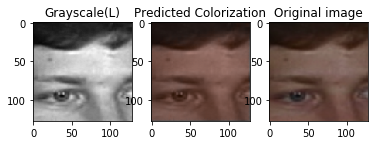

Loss in epoch  74  is  17.859286743051864


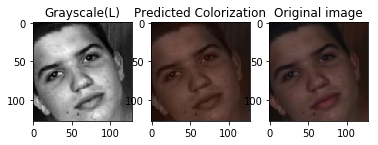

Loss in epoch  75  is  17.777374576119815


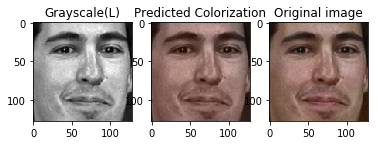

Loss in epoch  76  is  17.765231735566083


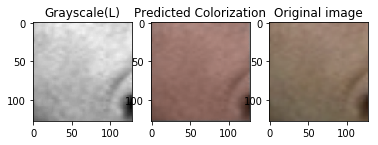

Loss in epoch  77  is  17.794410677517163


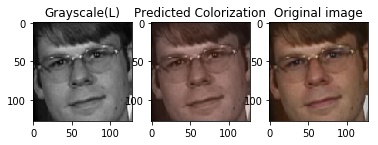

Loss in epoch  78  is  17.788509691462796


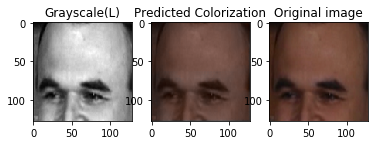

Loss in epoch  79  is  17.759895773494947


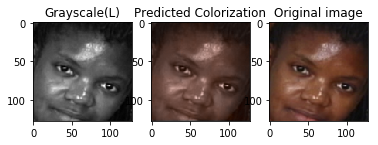

Loss in epoch  80  is  17.782026417115155


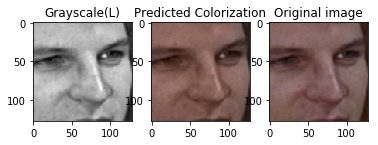

Loss in epoch  81  is  17.763887713937198


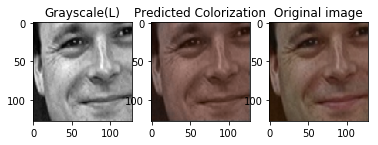

Loss in epoch  82  is  17.788335659924677


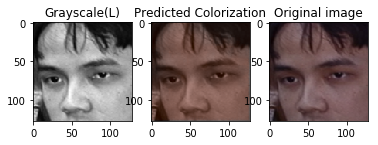

Loss in epoch  83  is  17.80326052273021


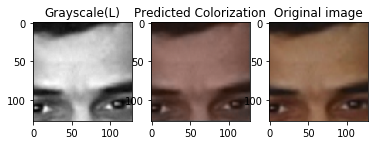

Loss in epoch  84  is  17.83250574504628


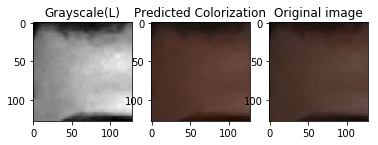

Loss in epoch  85  is  17.775686796973734


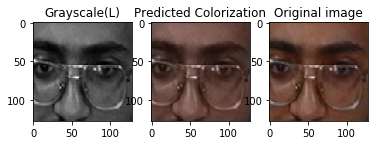

Loss in epoch  86  is  17.768667866201962


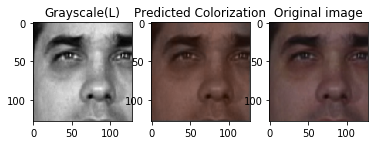

Loss in epoch  87  is  17.73656627711128


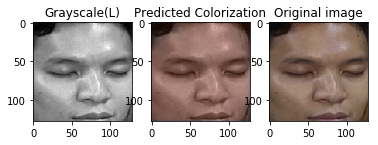

Loss in epoch  88  is  17.73418164253235


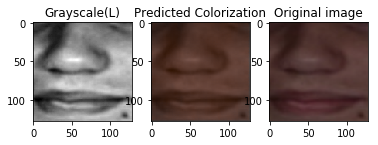

Loss in epoch  89  is  17.73462194554946


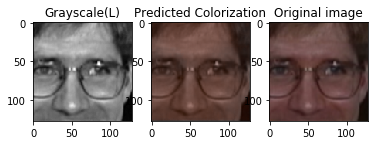

Loss in epoch  90  is  17.76458528462578


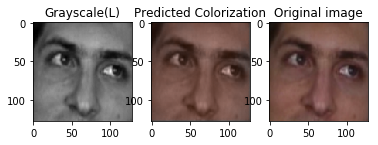

Loss in epoch  91  is  17.757573029574225


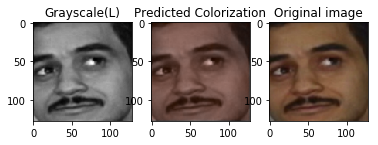

Loss in epoch  92  is  17.77975306791418


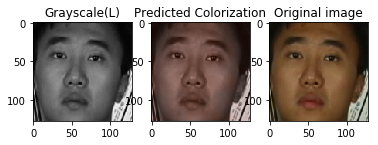

Loss in epoch  93  is  17.77141559825224


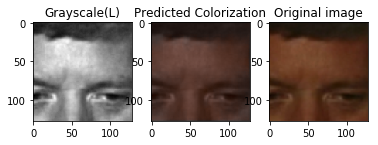

Loss in epoch  94  is  17.733792725731345


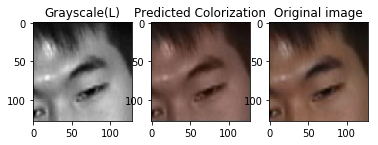

Loss in epoch  95  is  17.78298582750208


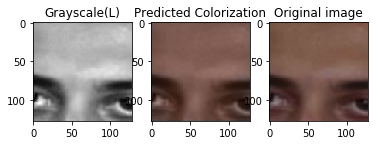

Loss in epoch  96  is  17.772832435720108


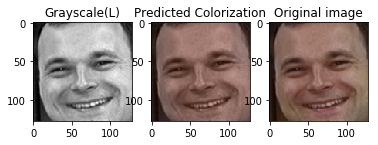

Loss in epoch  97  is  17.820721373838538


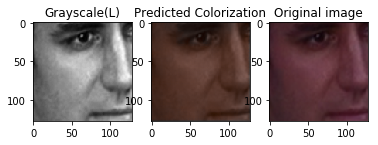

Loss in epoch  98  is  17.744976057725793


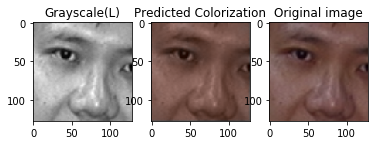

Loss in epoch  99  is  17.759526575312893


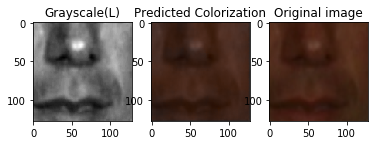

Loss in epoch  100  is  17.77081812129301


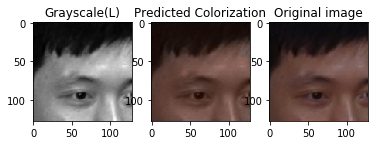

Loss in epoch  101  is  17.7137831659878


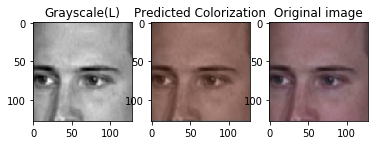

Loss in epoch  102  is  17.741421994040994


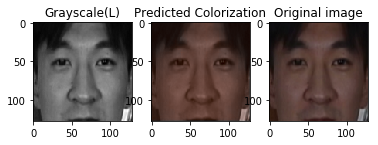

Loss in epoch  103  is  17.78346828853383


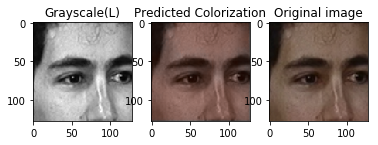

Loss in epoch  104  is  17.742688249139224


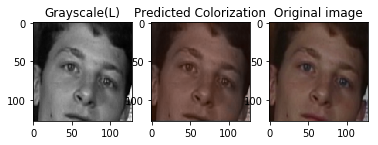

Loss in epoch  105  is  17.749557004255408


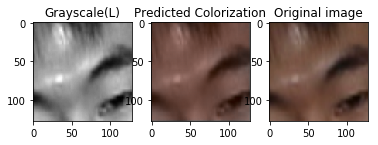

Loss in epoch  106  is  17.724456983454086


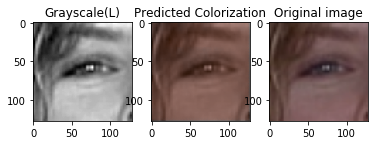

Loss in epoch  107  is  17.728149329914768


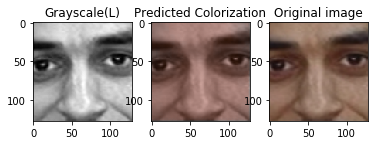

Loss in epoch  108  is  17.790135327507468


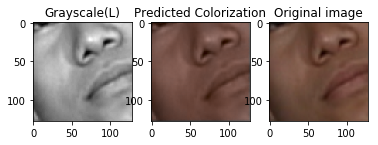

Loss in epoch  109  is  17.731118524775784


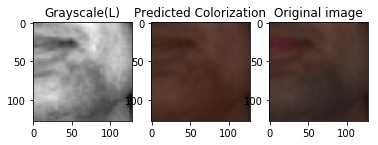

Loss in epoch  110  is  17.752111575182745


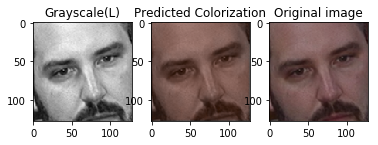

Loss in epoch  111  is  17.76993764148039


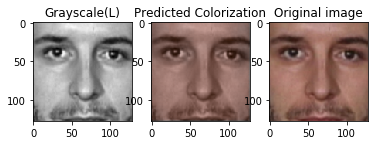

Loss in epoch  112  is  17.819557722877054


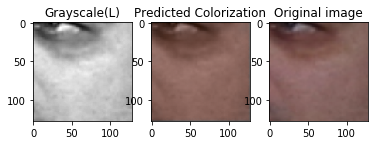

Loss in epoch  113  is  17.734161138534546


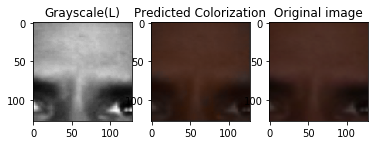

Loss in epoch  114  is  17.75995140917161


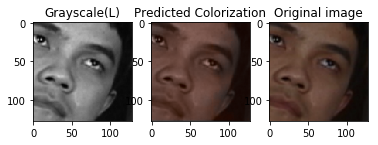

Loss in epoch  115  is  17.741339417064893


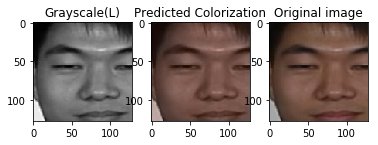

Loss in epoch  116  is  17.761268601698035


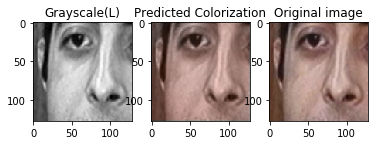

Loss in epoch  117  is  17.734795556348914


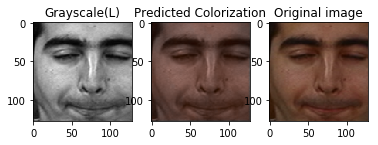

Loss in epoch  118  is  17.743398778578815


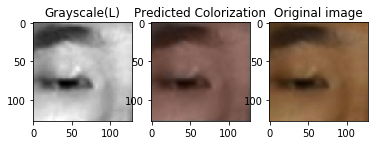

Loss in epoch  119  is  17.73515033721924


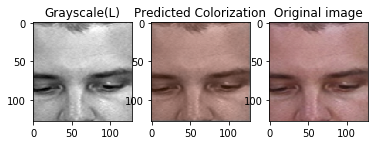

Loss in epoch  120  is  17.745805263519287


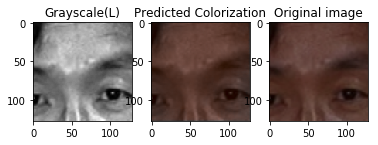

Loss in epoch  121  is  17.779771201750812


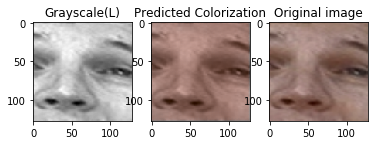

Loss in epoch  122  is  17.695581506280337


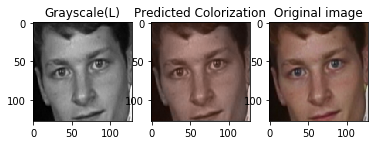

Loss in epoch  123  is  17.7265069063972


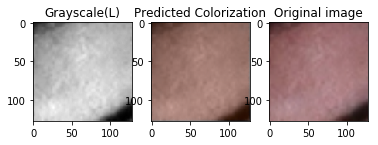

Loss in epoch  124  is  17.736897847231695


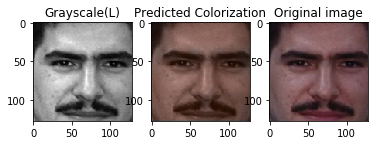

Loss in epoch  125  is  17.728459175895242


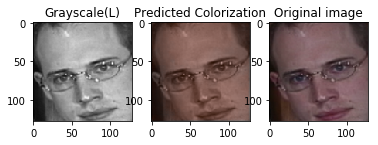

Loss in epoch  126  is  17.748950846054974


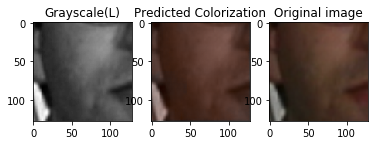

Loss in epoch  127  is  17.74164269952213


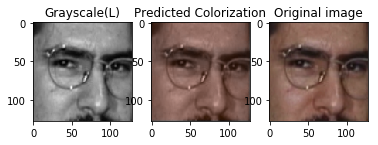

Loss in epoch  128  is  17.730141583610983


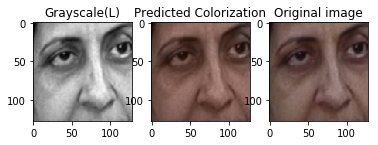

Loss in epoch  129  is  17.708349536446963


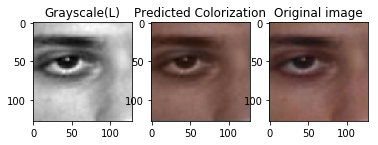

Loss in epoch  130  is  17.726428200216855


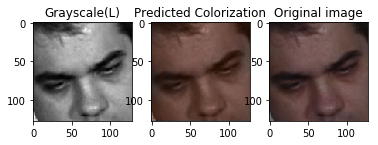

Loss in epoch  131  is  17.6986559419071


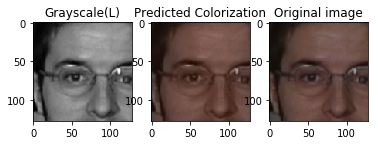

Loss in epoch  132  is  17.747627104029934


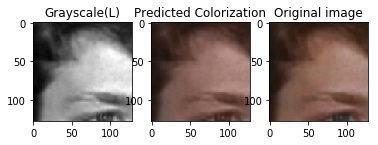

Loss in epoch  133  is  17.692431800505695


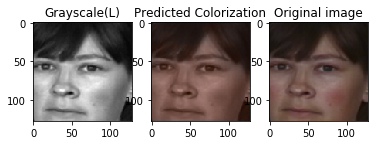

Loss in epoch  134  is  17.75377931314356


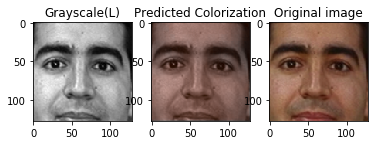

Loss in epoch  135  is  17.780129068038043


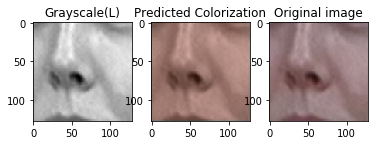

Loss in epoch  136  is  17.737059270634372


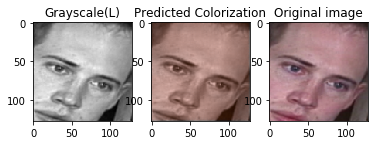

Loss in epoch  137  is  17.733125069562128


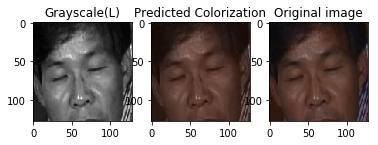

Loss in epoch  138  is  17.709261571659763


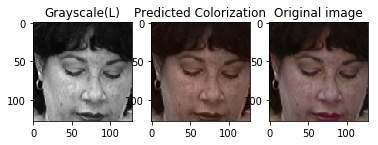

Loss in epoch  139  is  17.756363041260663


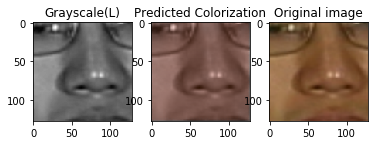

Loss in epoch  140  is  17.749705833547257


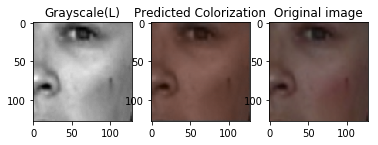

Loss in epoch  141  is  17.74471030515783


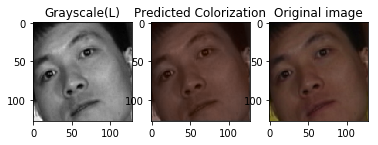

Loss in epoch  142  is  17.66778063774109


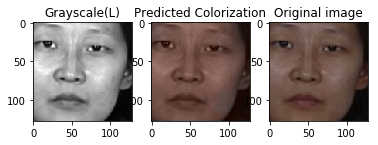

Loss in epoch  143  is  17.696660238153793


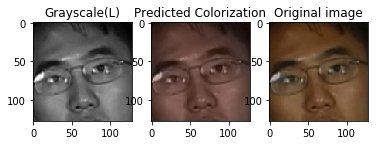

Loss in epoch  144  is  17.72432609165416


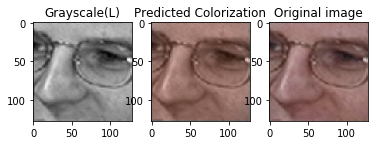

Loss in epoch  145  is  17.708453571095188


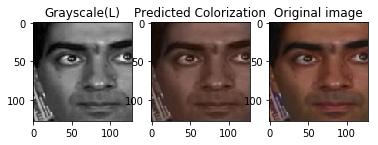

Loss in epoch  146  is  17.694519323461197


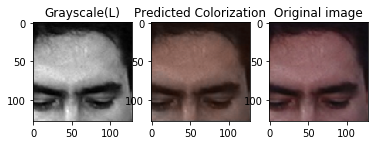

Loss in epoch  147  is  17.71732779110179


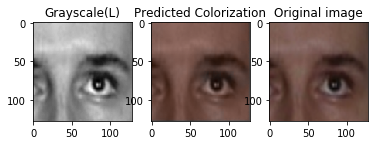

Loss in epoch  148  is  17.690870144787958


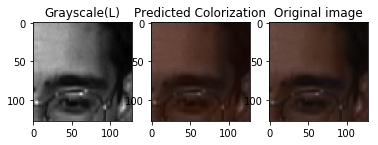

Loss in epoch  149  is  17.762656758813296


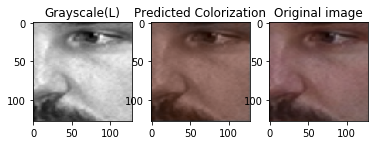

Loss in epoch  150  is  17.757093836279477


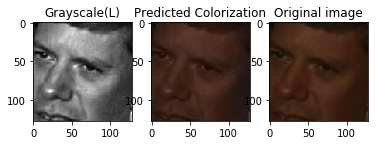

Loss in epoch  151  is  17.7664136465858


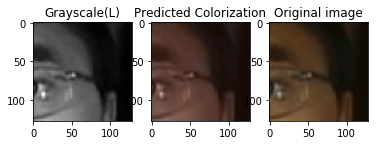

Loss in epoch  152  is  17.704909492941464


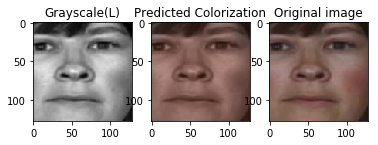

Loss in epoch  153  is  17.709124410853665


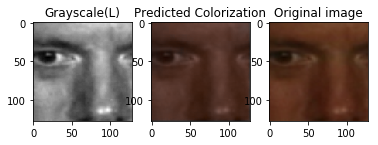

Loss in epoch  154  is  17.717147083843457


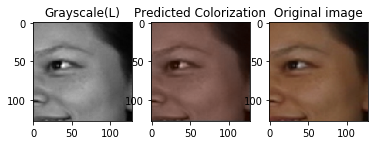

Loss in epoch  155  is  17.733956589418298


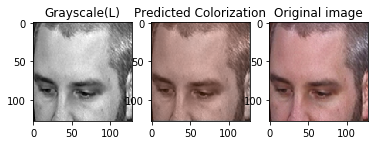

Loss in epoch  156  is  17.706177599289838


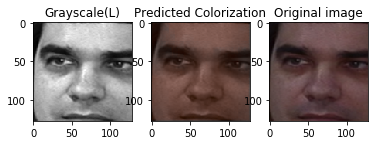

Loss in epoch  157  is  17.74034066761241


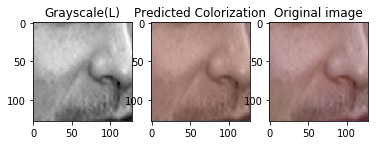

Loss in epoch  158  is  17.72059451832491


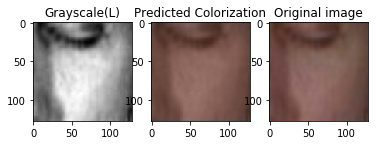

Loss in epoch  159  is  17.696388525121353


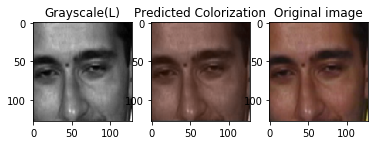

Loss in epoch  160  is  17.741178400376263


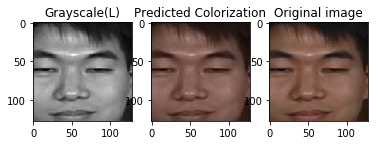

Loss in epoch  161  is  17.712783995796652


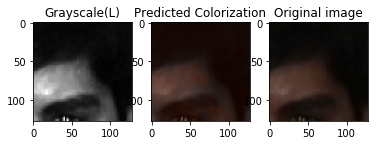

Loss in epoch  162  is  17.716194910161636


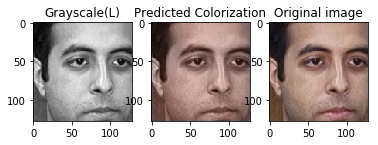

Loss in epoch  163  is  17.711536183076745


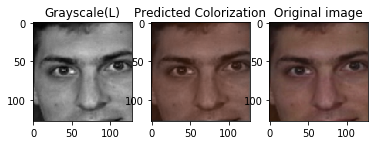

Loss in epoch  164  is  17.766149590997134


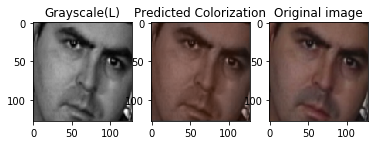

Loss in epoch  165  is  17.73163036739125


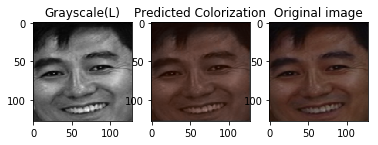

Loss in epoch  166  is  17.702735297820148


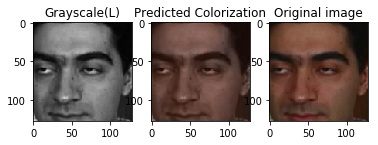

Loss in epoch  167  is  17.67849349975586


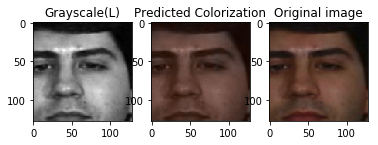

Loss in epoch  168  is  17.733988663729498


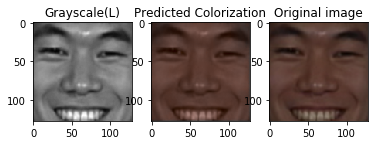

Loss in epoch  169  is  17.697414075627048


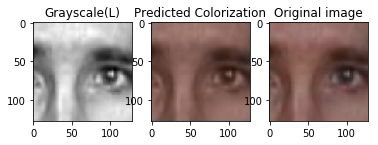

Loss in epoch  170  is  17.685175993863275


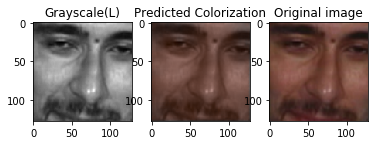

Loss in epoch  171  is  17.673741200390985


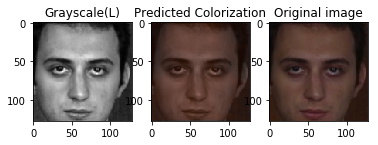

Loss in epoch  172  is  17.68858455209171


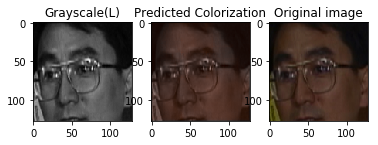

Loss in epoch  173  is  17.73689867468441


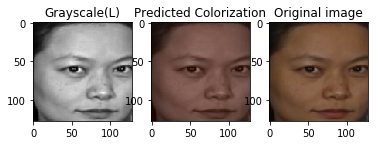

Loss in epoch  174  is  17.724167234757367


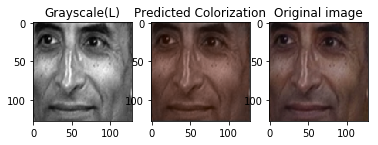

Loss in epoch  175  is  17.72103214263916


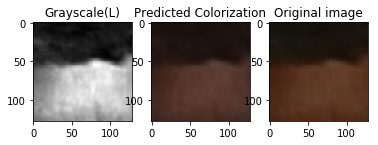

Loss in epoch  176  is  17.731584072113037


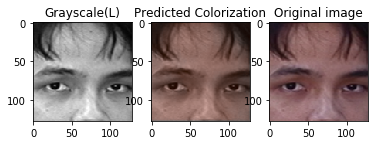

Loss in epoch  177  is  17.715678285149966


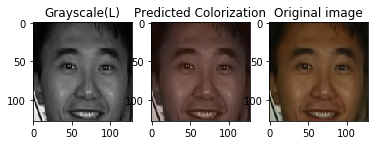

Loss in epoch  178  is  17.711429525824155


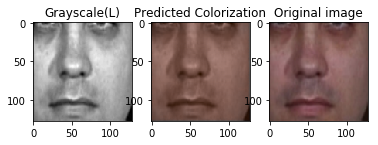

Loss in epoch  179  is  17.69933599584243


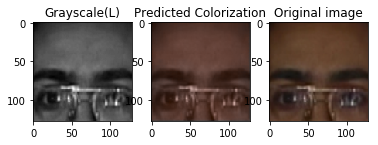

Loss in epoch  180  is  17.701809350182028


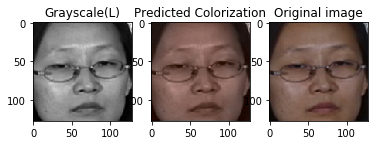

Loss in epoch  181  is  17.674785403644336


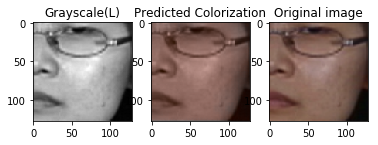

Loss in epoch  182  is  17.674453398760626


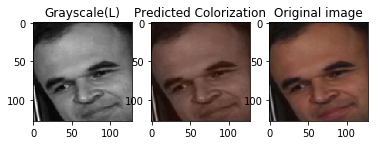

Loss in epoch  183  is  17.73482974837808


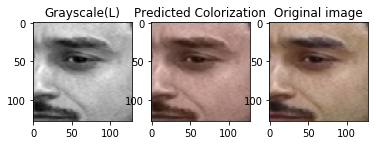

Loss in epoch  184  is  17.71183971797719


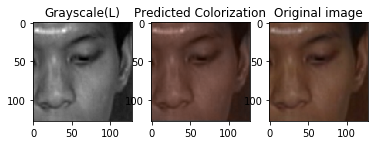

Loss in epoch  185  is  17.67541888180901


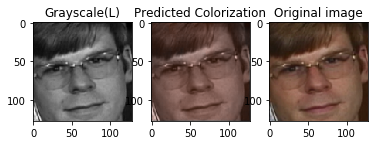

Loss in epoch  186  is  17.691909747965195


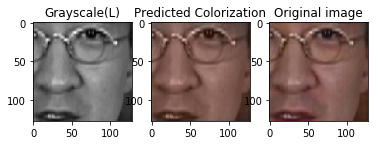

Loss in epoch  187  is  17.691726249807022


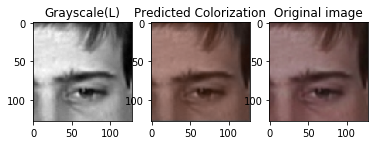

Loss in epoch  188  is  17.670374169069177


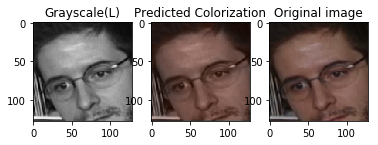

Loss in epoch  189  is  17.659416353001316


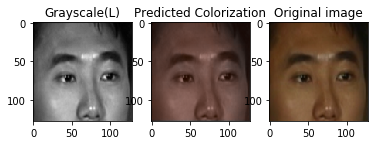

Loss in epoch  190  is  17.675699949264526


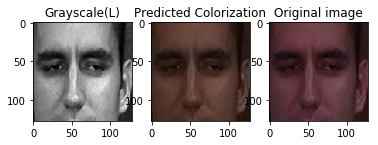

Loss in epoch  191  is  17.688598057802984


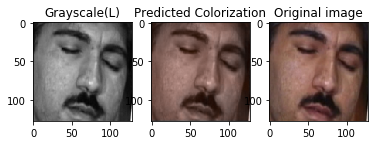

Loss in epoch  192  is  17.753603851093967


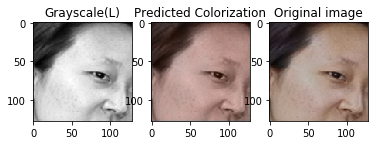

Loss in epoch  193  is  17.637308779884787


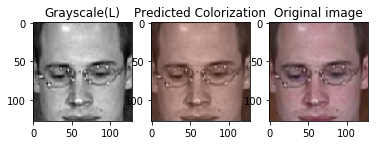

Loss in epoch  194  is  17.72812768992256


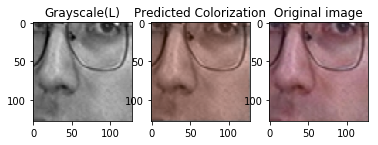

Loss in epoch  195  is  17.709263184491327


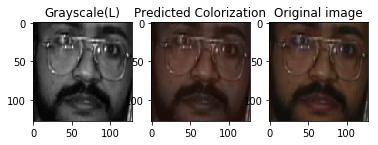

Loss in epoch  196  is  17.67251407398897


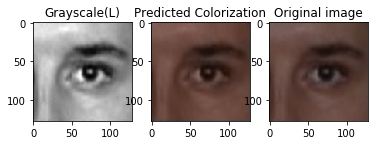

Loss in epoch  197  is  17.651624763713162


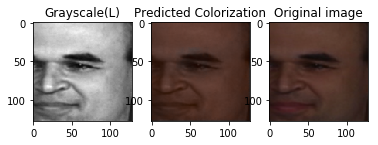

In [ ]:
# Train the network for 200 epochs

from skimage import  color
import matplotlib.pyplot as plt
%matplotlib inline
loss_list = []
for epoch in range(200):
  totalLoss = 0
  avgLoss = 0
  batch = 0
  flag = True
  for gImage,a,b in train_loader:
    gImage = torch.unsqueeze(gImage, 1)
    a = torch.unsqueeze(a, 1)
    b = torch.unsqueeze(b, 1)
    targetValues = torch.cat((a, b), dim=1)
    if torch.cuda.is_available():
      gImage = gImage.to(device)
      targetValues = targetValues.to(device)
    (pred, loss) = train(gImage,targetValues, criterion, optimizer,model)
    lab_pred = torch.cat((gImage,pred), dim=1).cpu().detach().numpy()
    lab_pred = lab_pred.transpose(0,2,3,1)
    lab_pred[:, :, :, 0:1] = lab_pred[:, :, :, 0:1] * 100
    lab_tar = torch.cat((gImage,targetValues), dim=1).cpu().detach().numpy()
    lab_tar = lab_tar.transpose(0,2,3,1)
    lab_tar[:, :, :, 0:1] = lab_tar[:, :, :, 0:1] * 100
    if useTanh == True:
      lab_pred[:, :, :, 1:3] = lab_pred[:, :, :, 1:3] * 128
      lab_tar[:, :, :, 1:3] = lab_tar[:, :, :, 1:3] * 128
    for i in range(lab_pred.shape[0]-1):
      if flag == True:
        pred_rgb=cv2.cvtColor(lab_pred[i], cv2.COLOR_LAB2BGR).astype("float64")
        tar_rgb=cv2.cvtColor(lab_tar[i], cv2.COLOR_LAB2BGR).astype("float64")
        plt.subplot(1,3, 1)
        plt.imshow(torch.squeeze(gImage[i]).cpu().detach().numpy(), cmap='gray')
        plt.title("Grayscale(L)")
        plt.subplot(1,3, 2)
        plt.imshow(pred_rgb)
        plt.title("Predicted Colorization")
        plt.subplot(1,3, 3)
        plt.imshow(tar_rgb)
        plt.title("Original image")
        plt.show()
        flag = False
    totalLoss = totalLoss + loss
    batch = batch + 1
  avgLoss = totalLoss / len(train_loader)
  loss_list.append(avgLoss)
  print("Loss in epoch ", epoch, " is ", avgLoss)
plt.plot(np.array(loss_list), 'r')
#torch.save(model.state_dict(), "Network1.pt")